# Comparing FBA results of different timepoints of mouse muscle tissue mitochondrial models

Aim of the notebook: Apply the statistics to the mouse mitochondrial aging data set


## Imports

In [3]:
import cobra
from cobra.io import read_sbml_model
from pathlib import Path
import numpy as np
import pandas as pd
import plotly.express as px
import plotly
import scipy.stats
import os 
import matplotlib.pyplot as plt
os.environ["OMP_NUM_THREADS"] = '1' # because of a data leak of KMeans on windows
import networkx as nx
import plotly.graph_objects as go
import fba_comparison_stats as cmp

data_dir = Path(".") / "mouse_models"
data_dir = data_dir.resolve()

## Load models and perform FBA

In [5]:
timepoints = [1, 3, 6, 9, 12, 15, 18, 21, 24, 27]
models = []
solutions = []
for i, t in enumerate(timepoints):
    curr_path = data_dir / f"Constrained_model_Muscle_m_{t}month.xml"
    models.append(read_sbml_model(str(curr_path.resolve())))
    solutions.append(models[i].optimize())

information on the models:

In [7]:
model = models[0]
model

Name,mitoMAP
Memory address,2249eff9610
Number of metabolites,445
Number of reactions,560
Number of genes,782
Number of groups,97
Objective expression,1.0*OF_ATP_mitoMap - 1.0*OF_ATP_mitoMap_reverse_44b94
Compartments,"Cytosol, Mitochondrion, External"


compare objective values:

In [9]:
obj_values = [sol.objective_value for sol in solutions]
for t, o in zip(timepoints, obj_values):
    print(f"{t} months: {o}")

1 months: 46.14328640561483
3 months: 49.00226556564631
6 months: 55.56651755212499
9 months: 54.105246606953386
12 months: 58.73963956520037
15 months: 50.08486552463714
18 months: 52.494057863590605
21 months: 52.09593425857109
24 months: 53.81693565954149
27 months: 56.27711120259209


## Create combined dataframe and preprocess data

create and filter dataframe:

In [12]:
conditions = ["M1", "M3", "M6", "M9", "M12", "M15", "M18", "M21", "M24", "M27"]
mouse = cmp.build_dataframe(model, solutions, conditions)
mouse_filtered = cmp.filter_dataframe(mouse, conditions, rounding = True)
print(f"Number of reactions in the models: {len(mouse)}")
print(f"Number of nonzero reactions in the models: {len(mouse_filtered)}")

Number of reactions in the models: 560
Number of nonzero reactions in the models: 213


normalize data:

In [14]:
mouse_normalized = cmp.normalize_dataframe_cols(mouse_filtered, conditions, obj_values) # biomass normalization
mouse_normalized_div_by_max = cmp.normalize_dataframe_rows(mouse_normalized, conditions, "div_by_max") # normalization reactions
mouse_normalized_div_by_max_changing = mouse_normalized_div_by_max[mouse_normalized_div_by_max['Std_dev'] >= 0.01] # only consider changing reactions
print(f"Number of normalized changing reactions: {len(mouse_normalized_div_by_max_changing)}")

Number of normalized changing reactions: 85


load additional data:

In [16]:
## pathway dict
pathway_dict = {}
with open('pathway_information/mouse_map_pathway_to_id.tsv', 'r') as file:
    for line in file:
        words = line.strip().split("\t")
        pathway_dict[words.pop(0)] = words

## id dict
id_dict = {}
with open('pathway_information/mouse_map_id_to_pathway.tsv', 'r') as file:
    for line in file:
        words = line.strip().split("\t")
        id_dict[words.pop(0)] = words
        
## pathway hierarchy
pathway_hierarchy = {}
with open('pathway_information/kegg_pathway_hierarchy.txt', 'r') as file:
    for line in file:
        words = line.replace("_", " ").split("\t")
        words = line.replace("_", " ").split("\\t")
        pathway_hierarchy[words.pop(0)] = words

## process dict
process_dict = {}
with open('pathway_information/mouse_map_process_to_id.tsv', 'r') as file:
    for line in file:
        words = line.strip().split("\t")
        process_dict[words.pop(0)] = words

## id-process dict
id_to_process_dict = {}
with open('pathway_information/mouse_map_id_to_process.tsv', 'r') as file:
    for line in file:
        words = line.strip().split("\t")
        id_to_process_dict[words.pop(0)] = words

## gene to rection id dicct
gene_to_id_dict = {}
with open('pathway_information/mouse_map_gene_to_id.tsv', 'r') as file:
    for line in file:
        words = line.strip().split("\t")
        gene_to_id_dict[words.pop(0)] = words

## id to gene dict
id_to_gene_dict = {}
with open('pathway_information/mouse_map_id_to_gene.tsv', 'r') as file:
    for line in file:
        words = line.strip().split("\t")
        id_to_gene_dict[words.pop(0)] = words

some statistics on the flux distribution of the data:

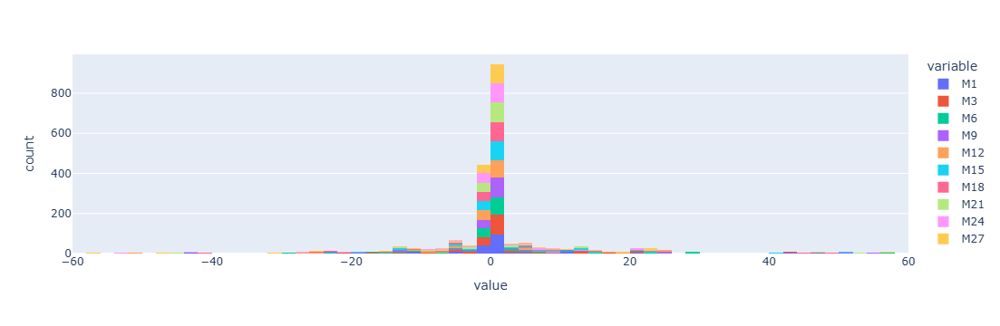

In [18]:
px.histogram(mouse_filtered, x=conditions)

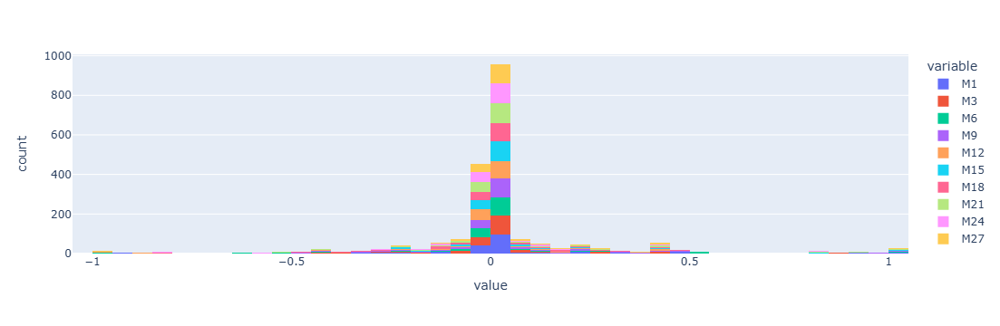

In [19]:
px.histogram(mouse_normalized, x=conditions)
# value range is -1.05 to +1.05

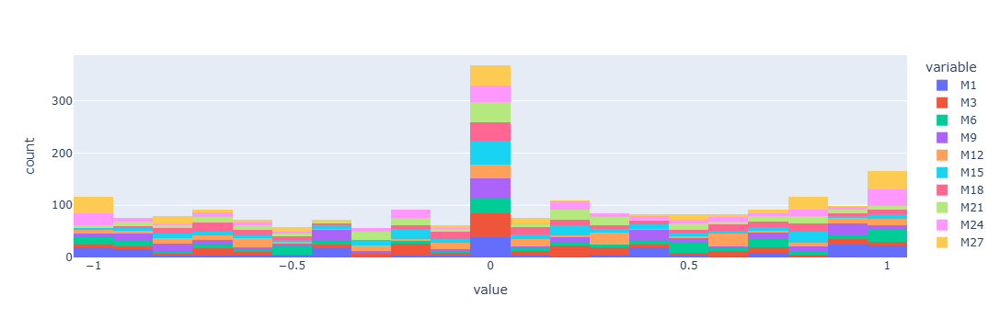

In [20]:
px.histogram(mouse_normalized_div_by_max, x=conditions)

The ETC has very low bounds:

In [22]:
print(f"Complex I: {model.reactions.CI_mitoMap.bounds}")
print(f"Complex II: {model.reactions.CII_mitoMap.bounds}") # complex 2 is not ecoded by mtDNA
print(f"Complex III: {model.reactions.CIII_mitoMap.bounds}")
print(f"Complex IV: {model.reactions.CIV_mitoMap.bounds}")
print(f"Complex V: {model.reactions.CV_mitoMap.bounds}")

Complex I: (-0.132240380334186, 0.132240380334186)
Complex II: (-50.6784314799104, 50.6784314799104)
Complex III: (-10.3647479168755, 10.3647479168755)
Complex IV: (0.0, 3.30167277727862)
Complex V: (-0.524880299891585, 0.524880299891585)


## Correlation between conditions
### Correlation matrix

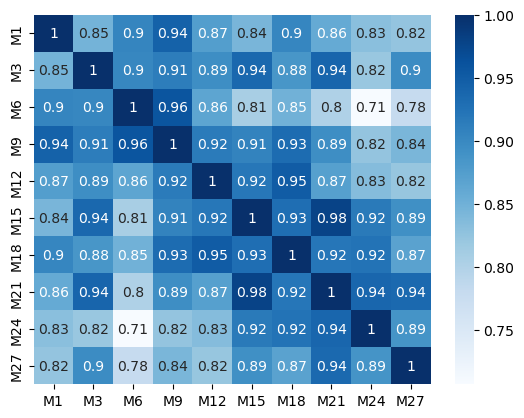

In [24]:
fig_r= cmp.correlation_matrix(mouse_normalized_div_by_max_changing, conditions, color="Blues")

### Scatter plots

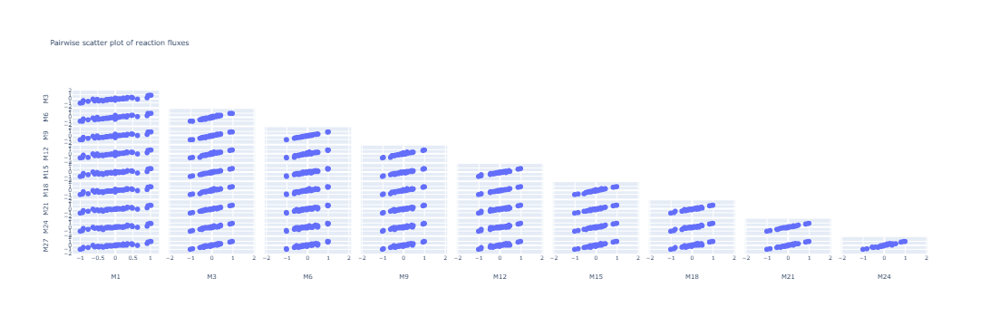

In [26]:
fig = cmp.scatter_plot_fluxes(mouse_normalized, conditions, font_size=6)
fig

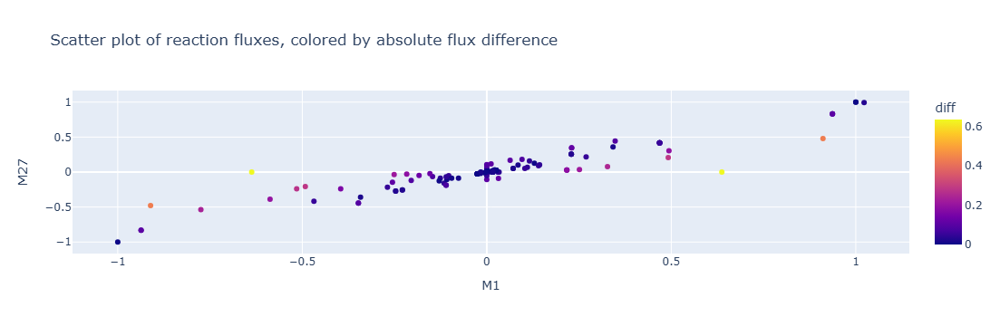

In [27]:
fig = cmp.scatter_plot_fluxes(mouse_normalized, ["M1", "M27"])
fig

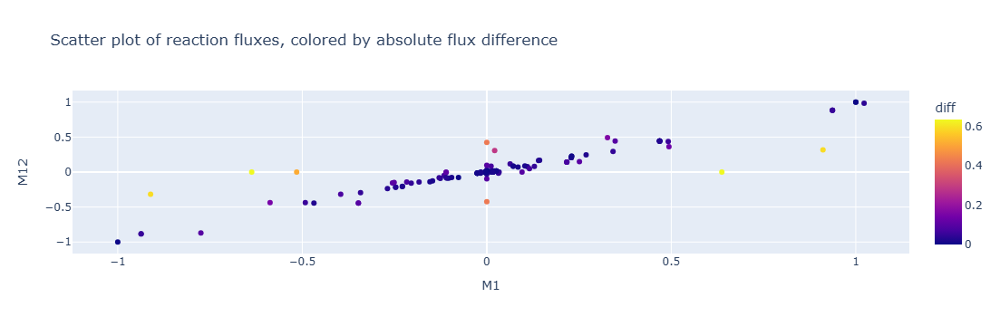

In [28]:
fig = cmp.scatter_plot_fluxes(mouse_normalized, ["M1", "M12"])
fig

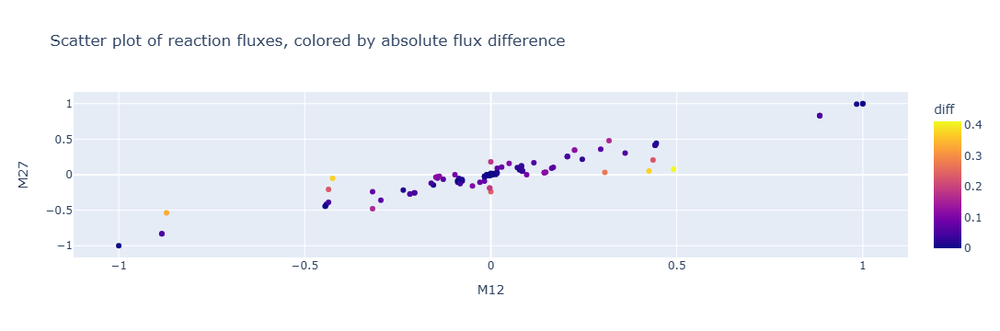

In [29]:
fig = cmp.scatter_plot_fluxes(mouse_normalized, ["M12", "M27"])
fig

## Identify reactions with most/least variation

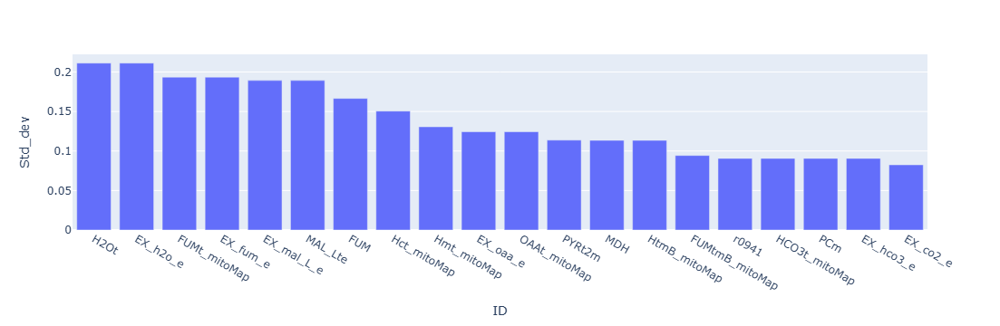

In [31]:
## identify reactions with the highest Std_dev
most_variable_bar_plot = cmp.bar_plot_flux_variation(mouse_normalized, conditions, 0, 20)
most_variable_bar_plot.show()

In [32]:
sorted_flux = mouse_normalized[["ID", "Name", "Std_dev"]].sort_values(by=['Std_dev'], ascending=False) 
sorted_flux["Kegg"] = [model.reactions.get_by_id(id).__dict__["notes"].get("KEGG id") for id in sorted_flux["ID"]]
sorted_flux[0:20]

,ID,Name,Std_dev,Kegg
535,H2Ot,R_H2Ot H2O transport via diffusion,0.211238,None
32,EX_h2o_e,EX_h2o_e,0.211238,None
516,FUMt_mitoMap,R_FUMt_mitoMap Fumarate transport,0.193473,None
25,EX_fum_e,EX_fum_e,0.193473,None
42,EX_mal_L_e,EX_mal_L_e,0.189264,None
529,MAL_Lte,R_MAL_Lte Malate transport,0.189264,None
124,FUM,R_FUM Fumarate + H2O --> (S)-Malate,0.166525,R01082
536,Hct_mitoMap,R_Hct_mitoMap Proton escape - cytosolic,0.150500,None
537,Hmt_mitoMap,R_Hmt_mitoMap Proton escape - mitochondrial,0.130624,None
50,EX_oaa_e,EX_oaa_e,0.124328,None


In [33]:
# corresponding pahways from KEGG
high_std_dev_dict = cmp.summarize_pathways(sorted_flux["ID"][0:20].tolist(), id_dict)

Citrate cycle (TCA cycle): 3 -> ['FUM', 'MDH', 'PCm']
Pyruvate metabolism: 3 -> ['FUM', 'MDH', 'PCm']
Other carbon fixation pathways: 3 -> ['FUM', 'MDH', 'PCm']
Metabolic pathways: 3 -> ['FUM', 'MDH', 'PCm']
Biosynthesis of secondary metabolites: 2 -> ['FUM', 'MDH']
Microbial metabolism in diverse environments: 3 -> ['FUM', 'MDH', 'PCm']
Carbon metabolism: 3 -> ['FUM', 'MDH', 'PCm']
Glyoxylate and dicarboxylate metabolism: 1 -> ['MDH']
Methane metabolism: 1 -> ['MDH']
Carbon fixation by Calvin cycle: 1 -> ['MDH']
Biosynthesis of amino acids: 1 -> ['PCm']


In [34]:
# corresponding processes in the mitoXplorer annotations
high_std_dev_dict = cmp.summarize_pathways(sorted_flux["ID"][0:20].tolist(), id_to_process_dict)

Tricarboxylic Acid Cycle: 2 -> ['FUM', 'MDH']
Pyruvate Metabolism: 1 -> ['PYRt2m']
Mitochondrial Carrier: 1 -> ['HtmB_mitoMap']
Amino Acid Metabolism: 1 -> ['PCm']


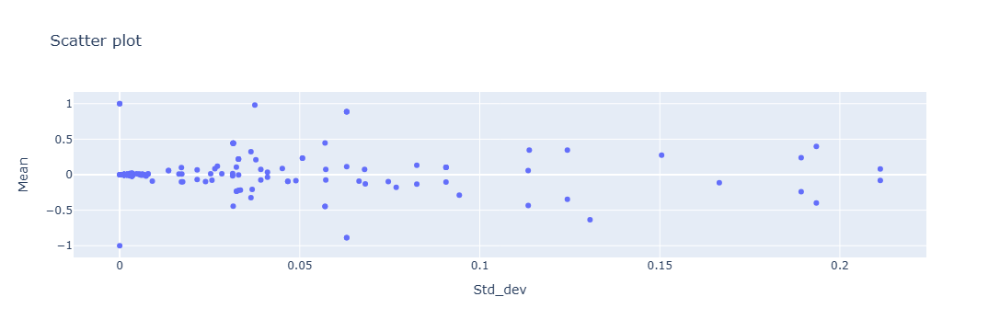

In [35]:
# plot mean against std dev of the data, this might reveal interesting reactions with low means and high std dev
fig = px.scatter(mouse_normalized, x = "Std_dev", y = "Mean", hover_name = "ID", hover_data = "Name",  title = "Scatter plot ")
fig.show()

## Pathways

In [37]:
## most changing pathways
pw_list = cmp.pathway_variability(mouse_normalized, pathway_dict, ascending=False, num=10)

Histidine metabolism		 -> 0.00 (contains 4 reactions)
Tyrosine metabolism		 -> 0.00 (contains 2 reactions)
Isoquinoline alkaloid biosynthesis		 -> 0.00 (contains 2 reactions)
Ubiquinone and other terpenoid-quinone biosynthesis		 -> 0.00 (contains 1 reactions)
Novobiocin biosynthesis		 -> 0.00 (contains 1 reactions)
Valine, leucine and isoleucine biosynthesis		 -> 0.00 (contains 1 reactions)
Lipoic acid metabolism		 -> 0.00 (contains 3 reactions)
Phenylalanine, tyrosine and tryptophan biosynthesis		 -> 0.00 (contains 3 reactions)
Cyanoamino acid metabolism		 -> 0.00 (contains 3 reactions)
Biosynthesis of unsaturated fatty acids		 -> 0.00 (contains 1 reactions)


In [38]:
## pathways that do not change
pw_list = cmp.pathway_variability(mouse_normalized, pathway_dict, ascending=True, num=15)

Pyruvate metabolism		 -> 0.08 (contains 8 reactions)
Citrate cycle (TCA cycle)		 -> 0.06 (contains 10 reactions)
Glycolysis / Gluconeogenesis		 -> 0.05 (contains 8 reactions)
Carbon fixation by Calvin cycle		 -> 0.05 (contains 8 reactions)
Methane metabolism		 -> 0.05 (contains 6 reactions)
Other carbon fixation pathways		 -> 0.05 (contains 14 reactions)
Microbial metabolism in diverse environments		 -> 0.04 (contains 29 reactions)
Glyoxylate and dicarboxylate metabolism		 -> 0.04 (contains 5 reactions)
Carbon metabolism		 -> 0.04 (contains 35 reactions)
Fructose and mannose metabolism		 -> 0.03 (contains 1 reactions)
Galactose metabolism		 -> 0.03 (contains 1 reactions)
Amino sugar and nucleotide sugar metabolism		 -> 0.03 (contains 1 reactions)
Biosynthesis of nucleotide sugars		 -> 0.03 (contains 1 reactions)
Biosynthesis of secondary metabolites		 -> 0.03 (contains 35 reactions)
Nitrogen metabolism		 -> 0.03 (contains 1 reactions)


In [39]:
## most changing processes from mitoXplorer annotations
pw_list = cmp.pathway_variability(mouse_normalized, process_dict, ascending=True, num=10)

Pyruvate Metabolism		 -> 0.07 (contains 2 reactions)
Mitochondrial Dynamics		 -> 0.06 (contains 1 reactions)
Tricarboxylic Acid Cycle		 -> 0.05 (contains 13 reactions)
Glycolysis		 -> 0.04 (contains 9 reactions)
Mitochondrial Carrier		 -> 0.02 (contains 18 reactions)
Amino Acid Metabolism		 -> 0.02 (contains 13 reactions)
Oxidative Phosphorylation (mt)		 -> 0.01 (contains 4 reactions)
Oxidative Phosphorylation		 -> 0.01 (contains 8 reactions)
Fatty Acid Degradation and Beta-oxidation		 -> 0.00 (contains 13 reactions)
Replication & Transcription		 -> 0.00 (contains 1 reactions)


In [40]:
## processes from mitoXplorer annotations that do not change
pw_list = cmp.pathway_variability(mouse_normalized, process_dict, ascending=False, num=8)

ROS Defense		 -> 0.00 (contains 4 reactions)
Nucleotide Metabolism		 -> 0.00 (contains 1 reactions)
Translation		 -> 0.00 (contains 1 reactions)
Nitrogen Metabolism		 -> 0.00 (contains 2 reactions)
Fatty Acid Biosynthesis and Elongation		 -> 0.00 (contains 12 reactions)
Folate & Pterine Metabolism		 -> 0.00 (contains 7 reactions)
Replication & Transcription		 -> 0.00 (contains 1 reactions)
Fatty Acid Degradation and Beta-oxidation		 -> 0.00 (contains 13 reactions)


## Group reactions by variability 

### Hierarchical clustering of the Std_dev

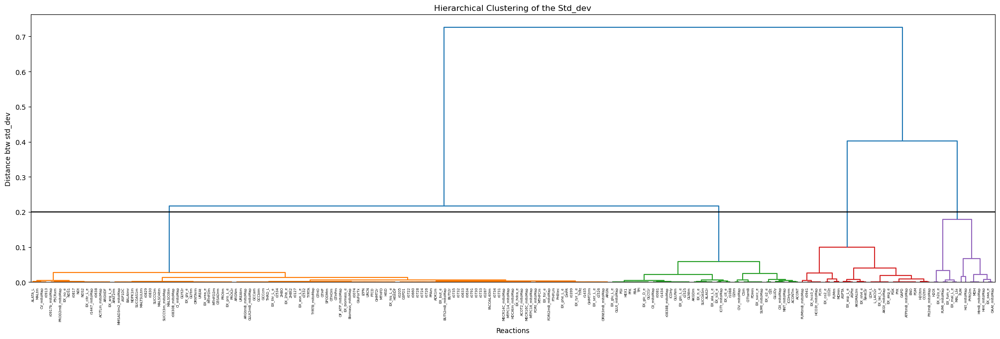

In [43]:
fancy_dendogram = cmp.hierarchical_clustering_std_dev(mouse_normalized, d_max=0.2)
fancy_dendogram.show()

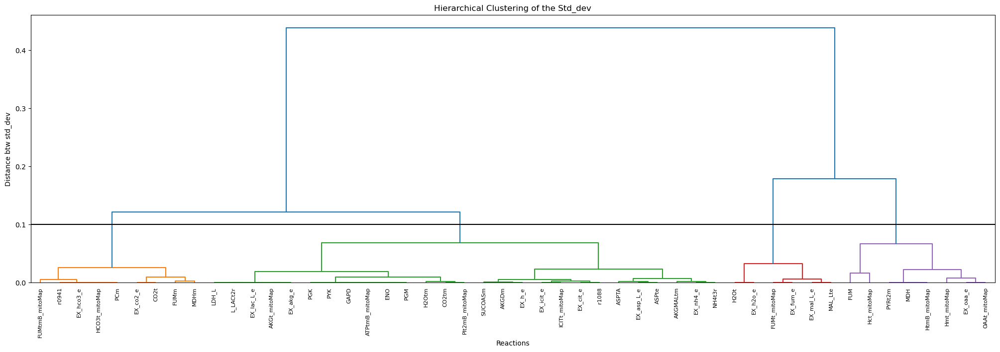

In [44]:
fancy_dendogram = cmp.hierarchical_clustering_std_dev(mouse_normalized, start = 0, end = 50,  d_max=0.1)
fancy_dendogram.show()

### PCA on flux differences

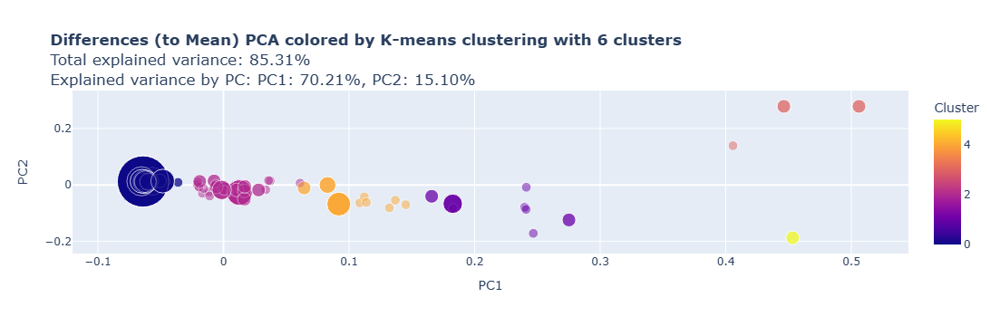

In [46]:
# without normalizing the reactions, base condition = "pseudo-mean"
pca = cmp.pca(mouse_normalized, conditions, clusters=6, method="Differences", base_condition="Mean", display="with_size")
pca.show()

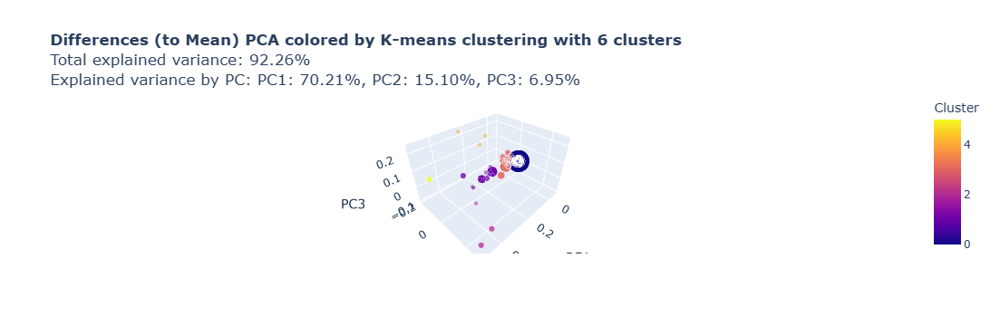

In [47]:
# 3D version
pca = cmp.pca(mouse_normalized, conditions, clusters=6, dimensions = 3, method="Differences", base_condition="Mean", display="with_size")
pca.show()

In [48]:
# in differnt layout to get list of all reactions for overlapping data points
pca = cmp.pca(mouse_normalized, conditions, clusters=6, method="Differences", base_condition="Mean", display="hvplot")
pca

:NdOverlay   [Cluster]
   :Scatter   [PC1]   (PC2,Node_size,ID,Name,Count,Std_dev,M1,M3,M6,M9,M12,M15,M18,M21,M24,M27)

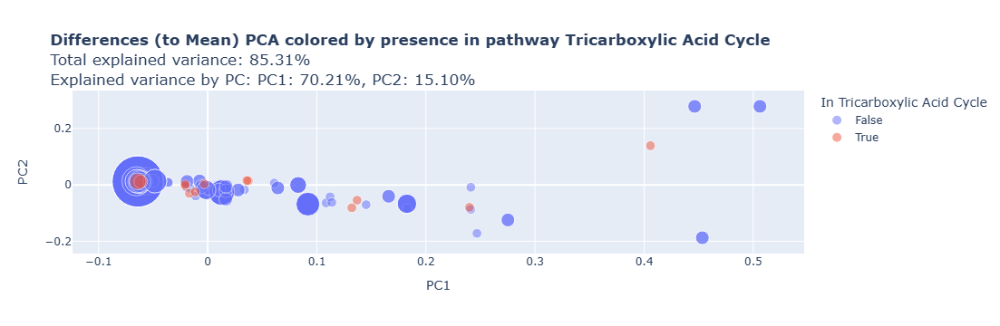

In [49]:
# color by pathway
# TCA cycle changes a lot (TCA-cycle from mitoXplorer annotations
pca = cmp.pca_color_by_pathway(mouse_normalized, conditions, "Tricarboxylic Acid Cycle", process_dict, method="Differences", base_condition="Mean", display="with_size")
pca

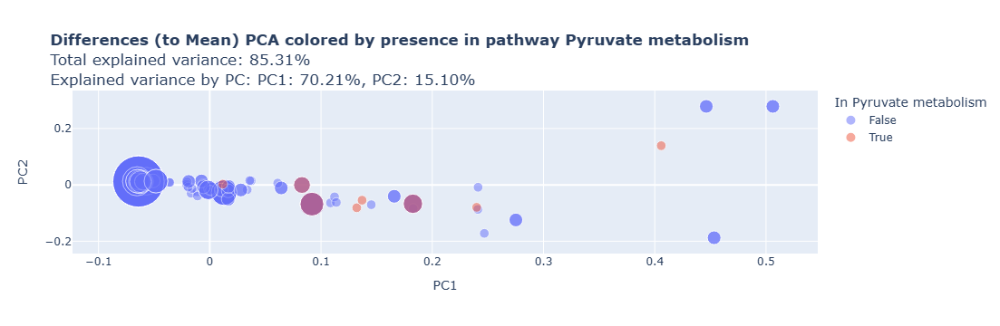

In [50]:
# Pyruvate metabolism (from KEGG)
pca = cmp.pca_color_by_pathway(mouse_normalized, conditions, "Pyruvate metabolism", pathway_dict, method="Differences", base_condition="Mean", display="with_size")
pca

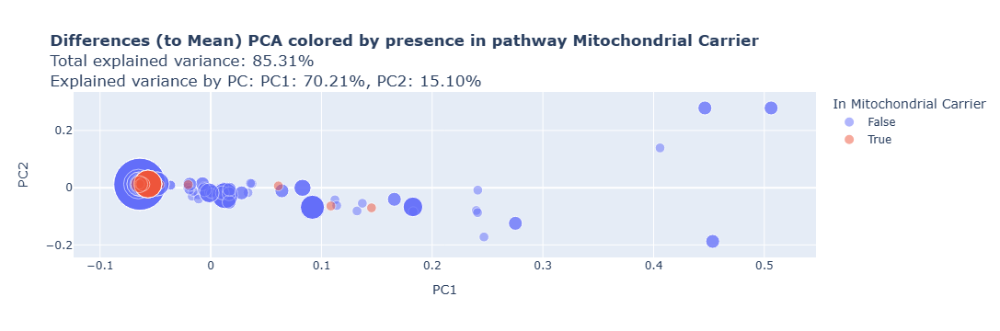

In [51]:
# Mitochondrial carrier (from mitoXplorer annotations)
pca = cmp.pca_color_by_pathway(mouse_normalized, conditions, "Mitochondrial Carrier", process_dict, method="Differences", base_condition="Mean", display="with_size")
pca

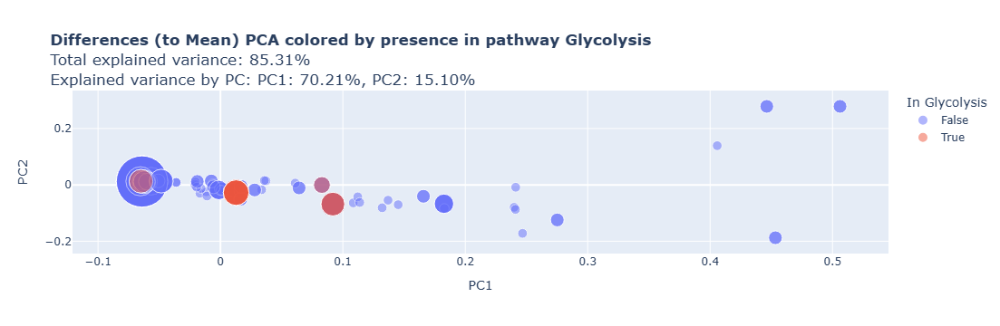

In [52]:
# Glycolysis (from mitoXplorer annotations)
pca = cmp.pca_color_by_pathway(mouse_normalized, conditions, "Glycolysis", process_dict, method="Differences", base_condition="Mean", display="with_size")
pca

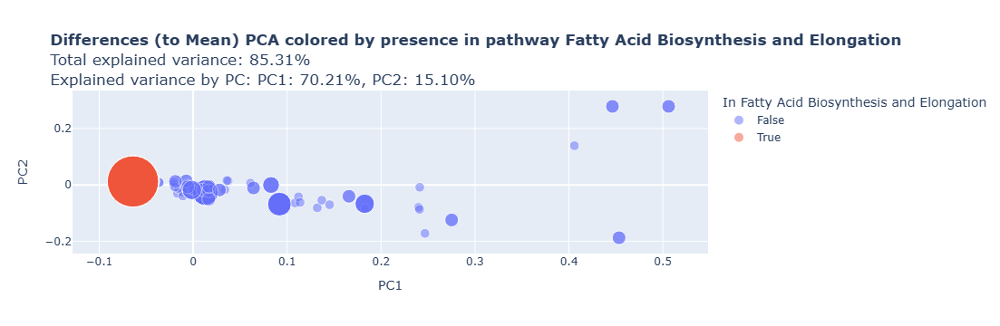

In [53]:
# Fatty acid biosynthesis and elongation metabolism (from mitoXplorer annotations) doesn't change
pca = cmp.pca_color_by_pathway(mouse_normalized, conditions, "Fatty Acid Biosynthesis and Elongation", process_dict, method="Differences", base_condition="Mean", display="with_size")
pca

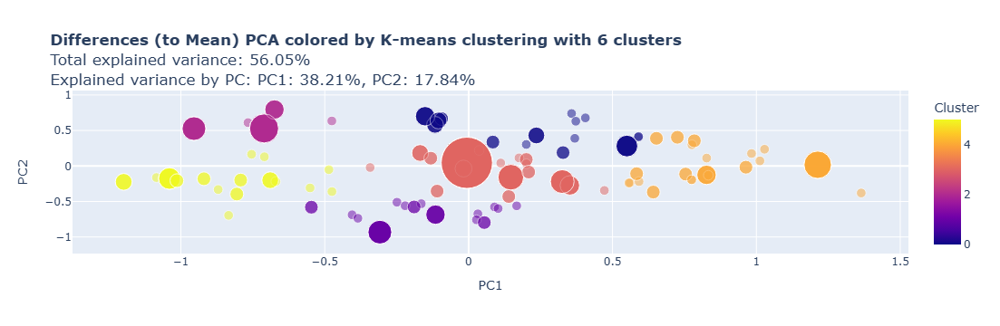

In [54]:
## with normalization of the reactions
pca = cmp.pca(mouse_normalized_div_by_max, conditions, clusters=6, method="Differences", base_condition="Mean", display="with_size")
pca.show()

In [55]:
# in differnt layout to get list of all reactions for overlapping data points
pca = cmp.pca(mouse_normalized_div_by_max, conditions, clusters=6, method="Differences", base_condition="Mean", display="hvplot")
pca

:NdOverlay   [Cluster]
   :Scatter   [PC1]   (PC2,Node_size,ID,Name,Count,Std_dev,M1,M3,M6,M9,M12,M15,M18,M21,M24,M27)

## Flux coupling Analysis

### Correlation PCA

128 reaction were removed, because their Std_dev is lower than 0.01
The following 5 reactions were removed because they swap signs across conditions: ['EX_h2o_e', 'ICDHy', 'PIt2mB_mitoMap', 'ATPtmB_mitoMap', 'H2Ot']


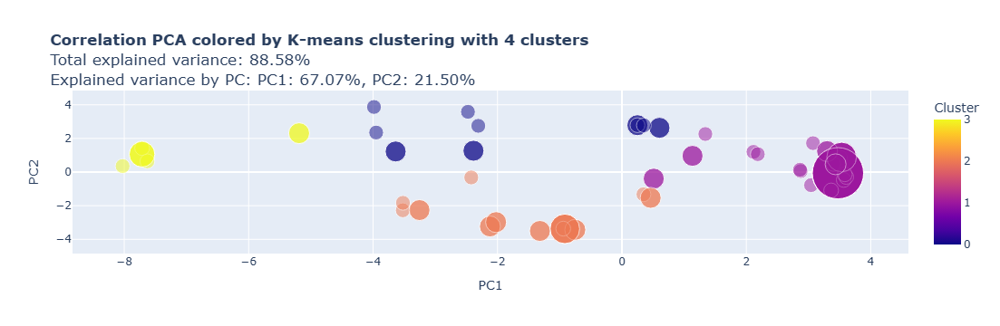

In [58]:
fig = cmp.pca(mouse_normalized_div_by_max, conditions, method="Correlation", clusters=4, display="with_size")
fig.show()

In [59]:
# colored by glycolysis/gluconeogenesis
fig = cmp.pca_color_by_pathway(mouse_normalized_div_by_max, conditions, "Glycolysis / Gluconeogenesis", pathway_dict , method="Correlation", display="hvplot")
fig

128 reaction were removed, because their Std_dev is lower than 0.01
The following 5 reactions were removed because they swap signs across conditions: ['EX_h2o_e', 'ICDHy', 'PIt2mB_mitoMap', 'ATPtmB_mitoMap', 'H2Ot']


:NdOverlay   [In_pathway]
   :Scatter   [PC1]   (PC2,Node_size,ID,Name,Count,Std_dev,M1,M3,M6,M9,M12,M15,M18,M21,M24,M27)

128 reaction were removed, because their Std_dev is lower than 0.01
The following 5 reactions were removed because they swap signs across conditions: ['EX_h2o_e', 'ICDHy', 'PIt2mB_mitoMap', 'ATPtmB_mitoMap', 'H2Ot']


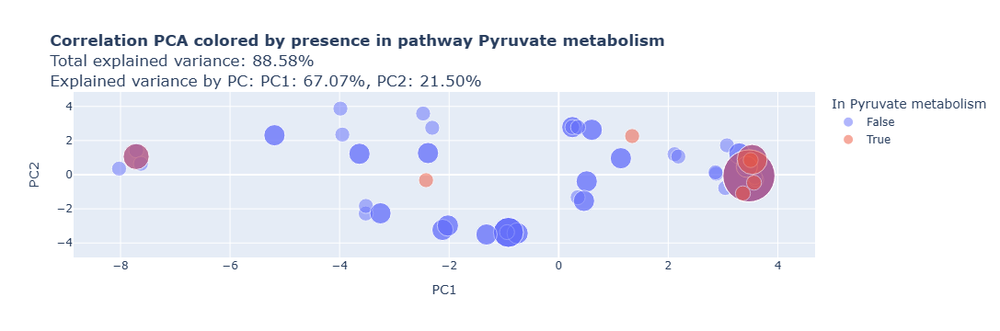

In [60]:
# colored by pyruvate metablism
fig = cmp.pca_color_by_pathway(mouse_normalized_div_by_max, conditions, "Pyruvate metabolism", pathway_dict, method="Correlation", display="with_size")
fig.show()

128 reaction were removed, because their Std_dev is lower than 0.01
The following 5 reactions were removed because they swap signs across conditions: ['EX_h2o_e', 'ICDHy', 'PIt2mB_mitoMap', 'ATPtmB_mitoMap', 'H2Ot']


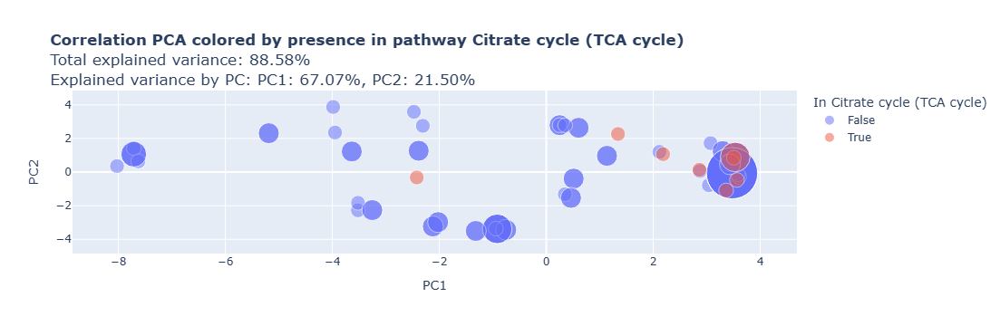

In [61]:
# colored by TCA cycle
fig = cmp.pca_color_by_pathway(mouse_normalized_div_by_max, conditions, "Citrate cycle (TCA cycle)", pathway_dict, method="Correlation", display="with_size")
fig.show()

### Flux correlation network

In [63]:
corr_matrix = cmp.flux_coupling_matrix(mouse_normalized_div_by_max, conditions, remove_unchanging=0.01, abs_values=True)

128 reaction were removed, because their Std_dev is lower than 0.01
The following 5 reactions were removed because they swap signs across conditions: ['EX_h2o_e', 'ICDHy', 'PIt2mB_mitoMap', 'ATPtmB_mitoMap', 'H2Ot']


Created Flux Coupling network with pc threshold 0.7.
Number of nodes: 80
Number of edges: 604
Number of connected components: 10


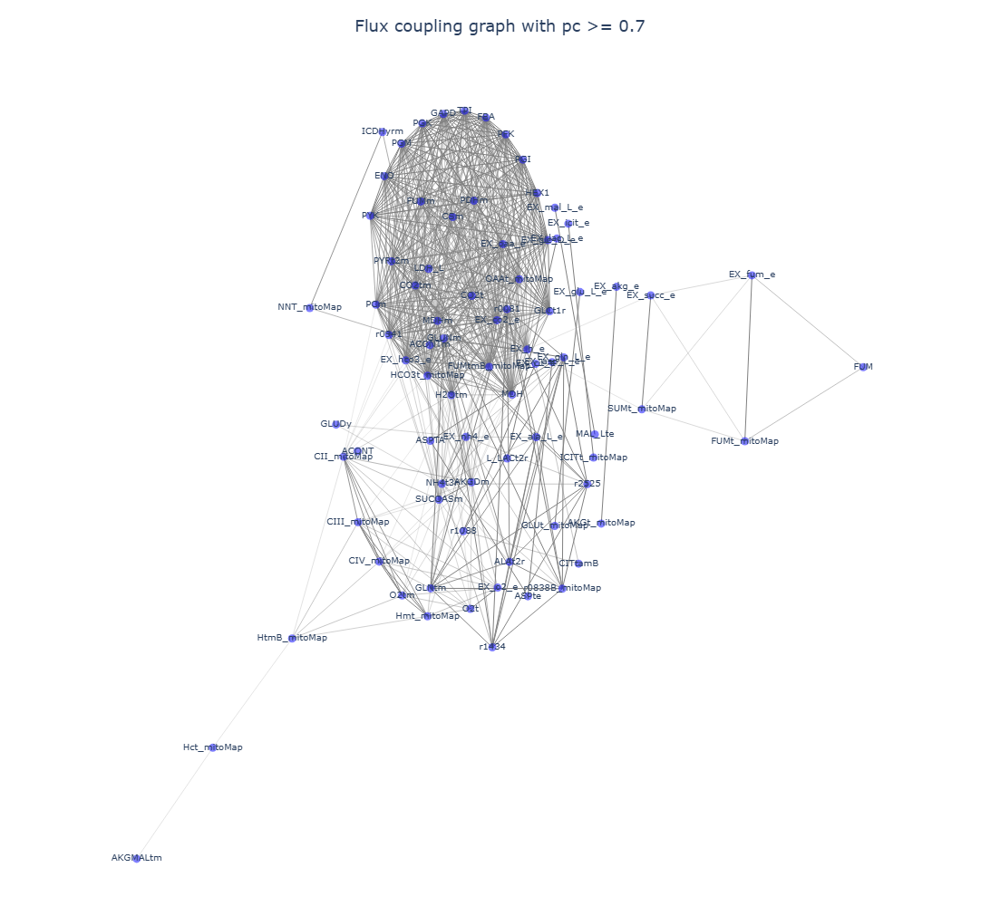

In [64]:
nw = cmp.flux_coupling_network(corr_matrix, pc=0.7)
fig = cmp.visualize_interactive_network(nw, mouse_normalized_div_by_max, conditions)
fig.show()

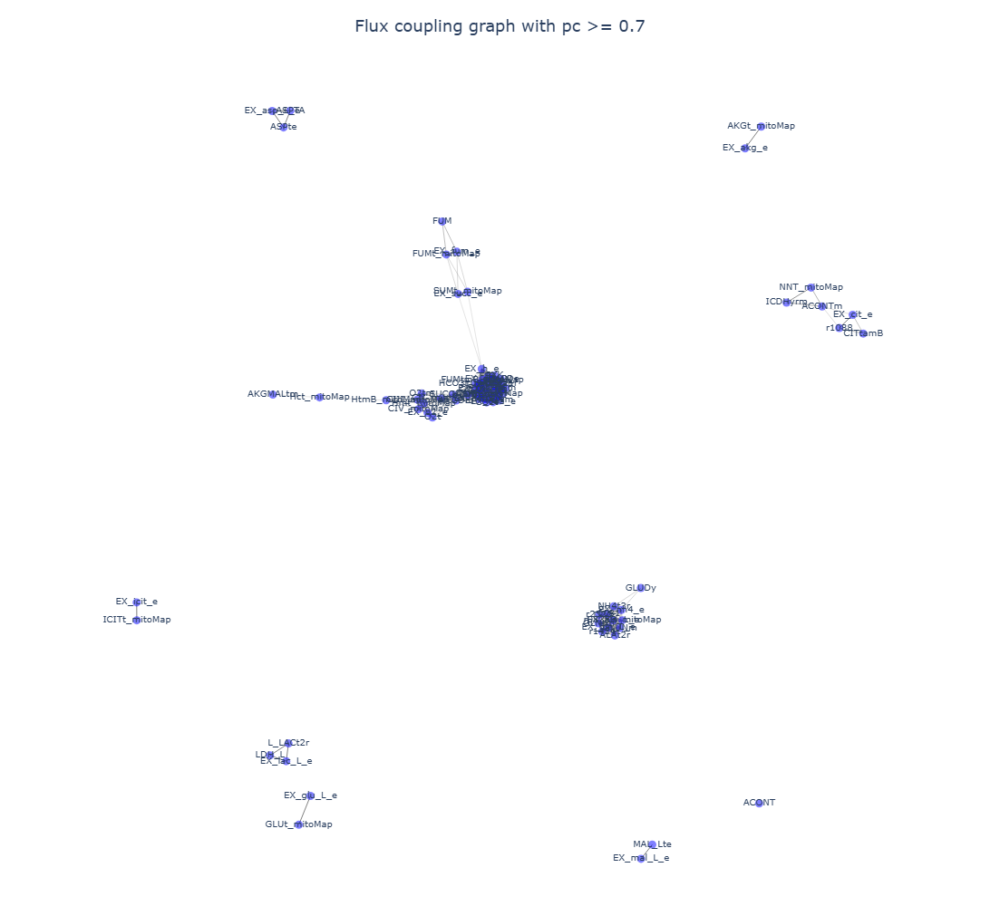

In [65]:
# network in spring layout to better visualize differet connected components
fig = cmp.visualize_interactive_network(nw, mouse_normalized_div_by_max, conditions, layout = "spring")
fig.show()

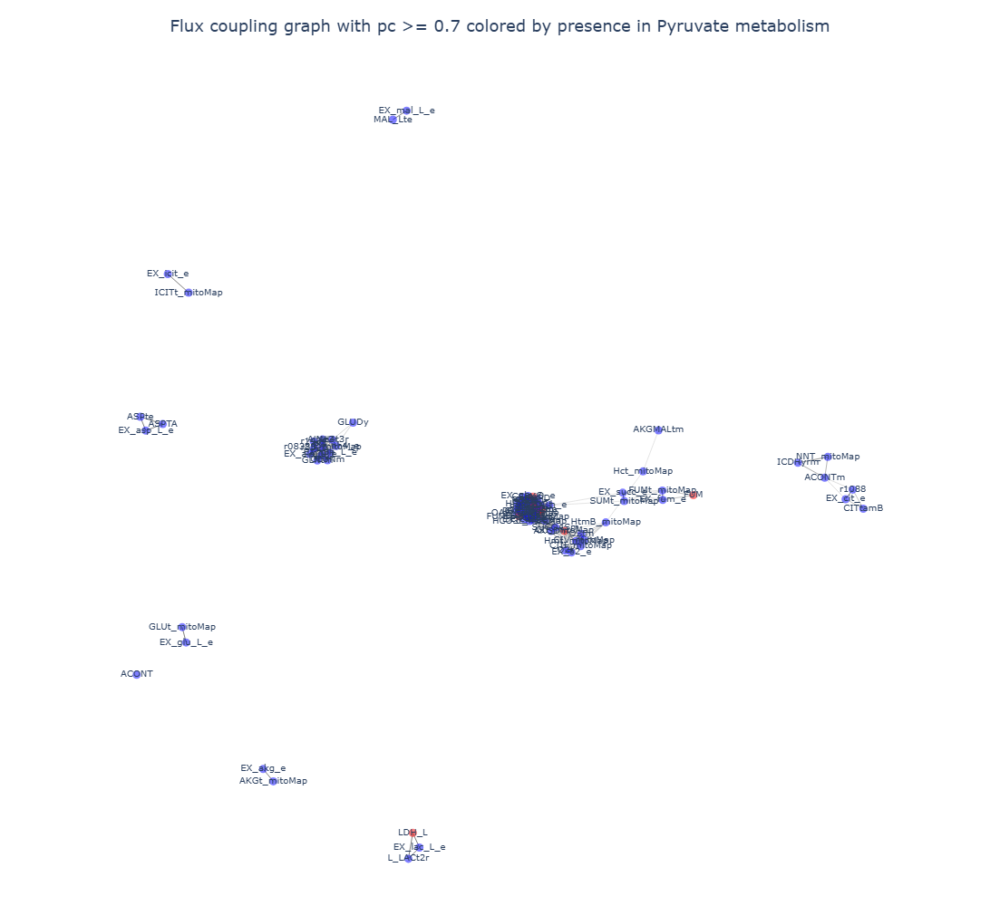

In [66]:
# network colored by pyruvate metabolism
cmp.color_network_by_pathway(nw, "Pyruvate metabolism", pathway_dict)
fig = cmp.visualize_interactive_network(nw, mouse_normalized_div_by_max, conditions, layout = "spring")
fig.show()

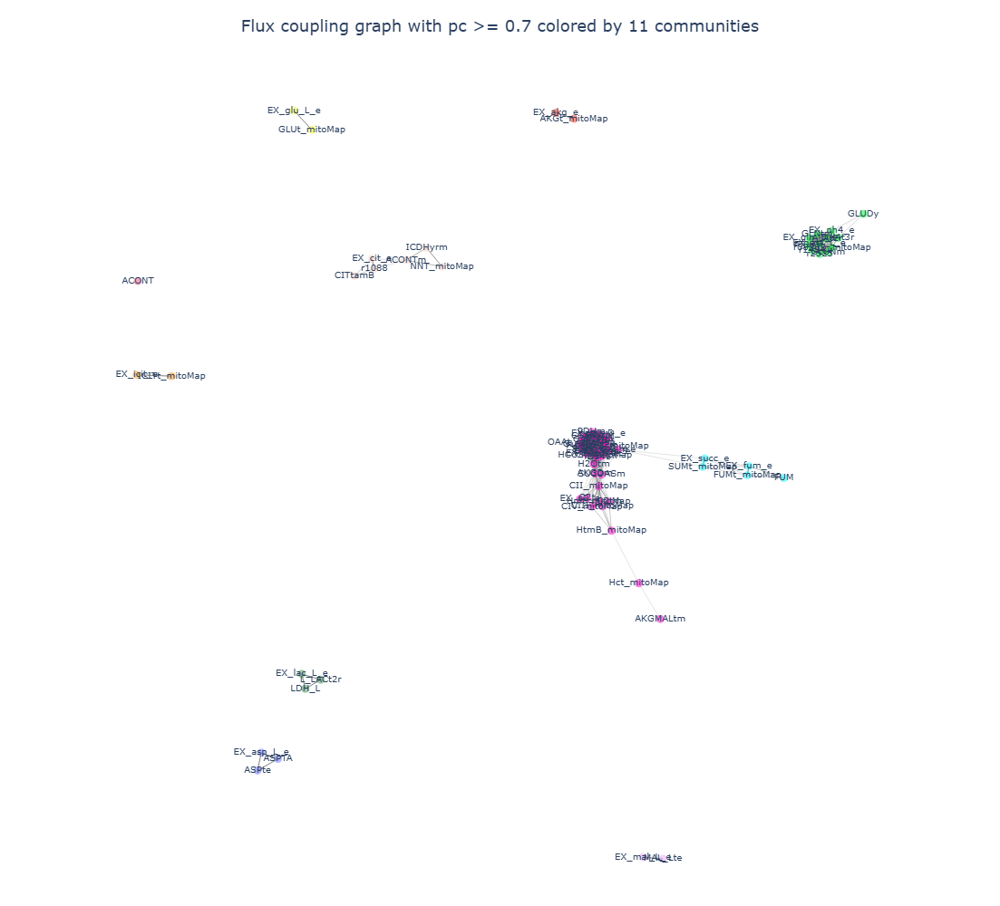

In [67]:
# network colored by communities
cmp.color_network_by_communities(nw, 1, include_weights=True) # takes edge weights into account!
fig = cmp.visualize_interactive_network(nw, mouse_normalized_div_by_max, conditions, layout = "spring")
fig.show()

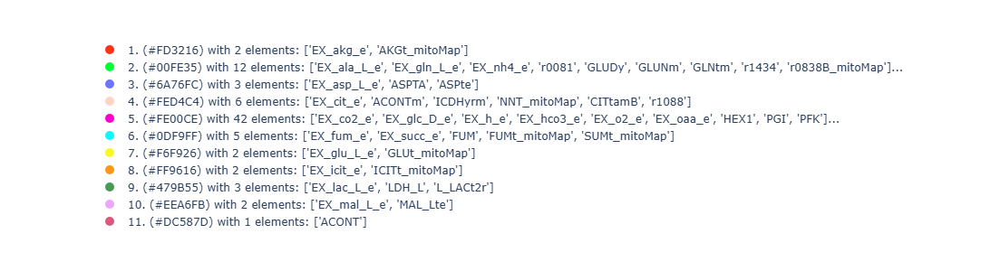

In [68]:
comm_map = cmp.get_community_list(nw)
color = cmp.get_color_map(comm_map)

### Box plots

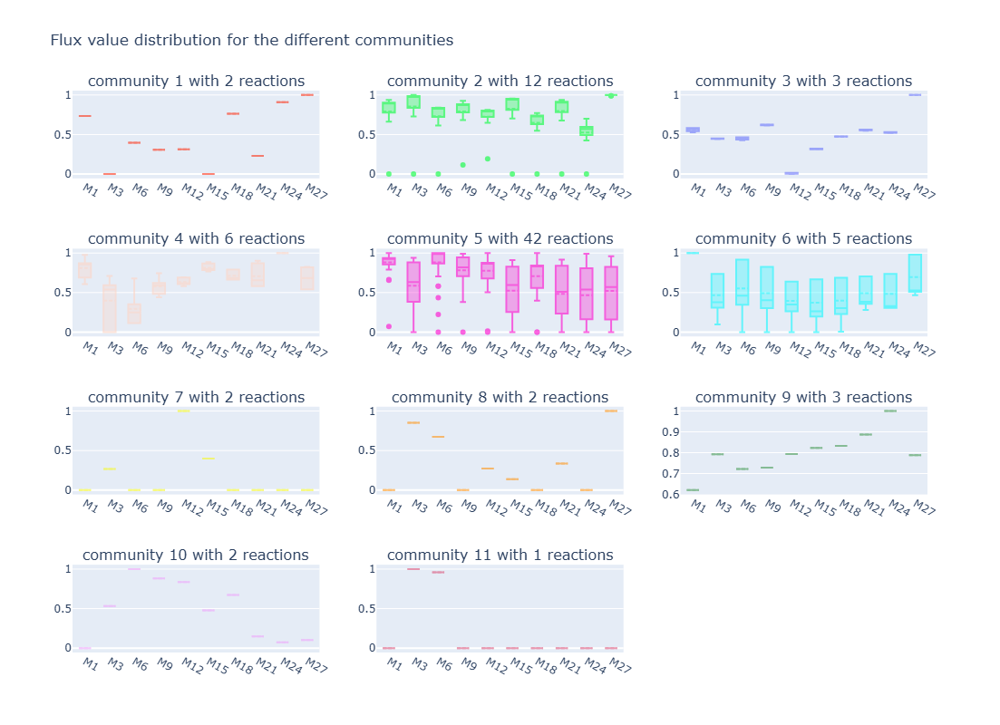

In [70]:
# using the div_by_max normalized data
fig = cmp.community_box_plots(mouse_normalized_div_by_max, conditions, comm_map)
fig.show()

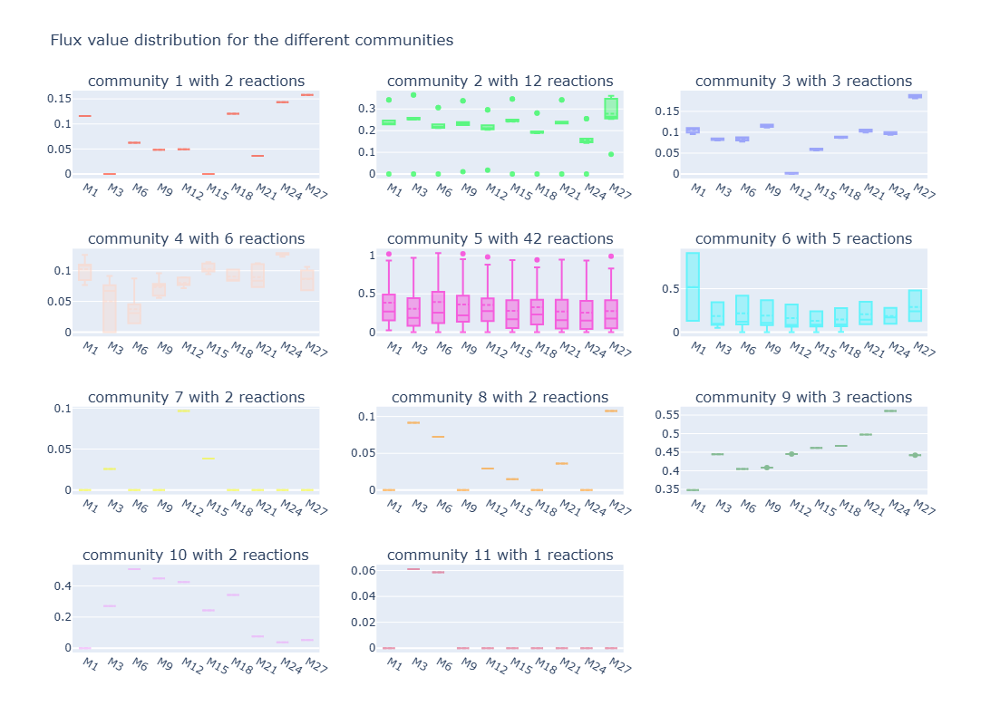

In [71]:
# using not div_by_max normalized data
fig = cmp.community_box_plots(mouse_normalized, conditions, comm_map)
fig.show()

In [72]:
# analyze community 4
print(f"Reactions in community 4: {comm_map[color[4]]}")
print("Associated processes:")
pws = cmp.summarize_pathways(comm_map[color[4]], id_to_process_dict)

Reactions in community 4: ['EX_cit_e', 'ACONTm', 'ICDHyrm', 'NNT_mitoMap', 'CITtamB', 'r1088']
Associated processes:
Tricarboxylic Acid Cycle: 2 -> ['ACONTm', 'ICDHyrm']
Mitochondrial Carrier: 1 -> ['CITtamB']


In [73]:
# analyze community 6
print(f"Reactions in community 6: {comm_map[color[6]]}")
print("Associated processes:")
pws = cmp.summarize_pathways(comm_map[color[6]], id_to_process_dict)

Reactions in community 6: ['EX_fum_e', 'EX_succ_e', 'FUM', 'FUMt_mitoMap', 'SUMt_mitoMap']
Associated processes:
Tricarboxylic Acid Cycle: 1 -> ['FUM']


In [74]:
# analyze community 9
print(f"Reactions in community 9: {comm_map[color[9]]}")
print("Associated processes:")
pws = cmp.summarize_pathways(comm_map[color[9]], id_to_process_dict)

Reactions in community 9: ['EX_lac_L_e', 'LDH_L', 'L_LACt2r']
Associated processes:
Glycolysis: 1 -> ['LDH_L']


In [75]:
# analyze community 10
print(f"Reactions in community 10: {comm_map[color[10]]}")
print("Associated processes:")
pws = cmp.summarize_pathways(comm_map[color[10]], id_to_process_dict)

Reactions in community 10: ['EX_mal_L_e', 'MAL_Lte']
Associated processes:


### Sankey diagrams

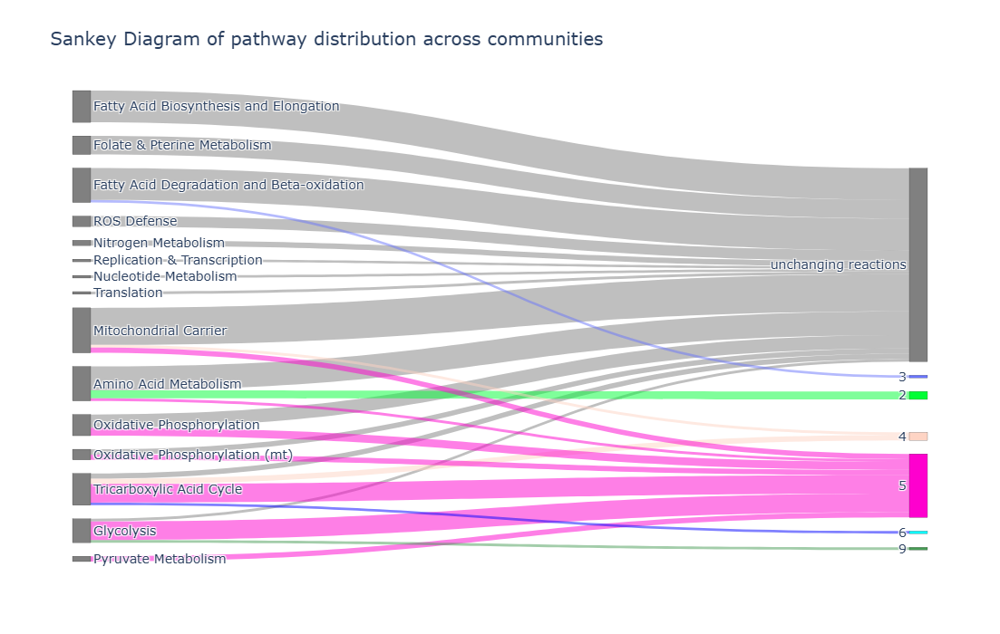

In [77]:
# sankey diagram of mitoXplorer processes
fig = cmp.community_sankey_diagram(comm_map, list(process_dict.keys()), mouse_normalized_div_by_max, id_to_process_dict, diagram_height = 700)
fig.show()

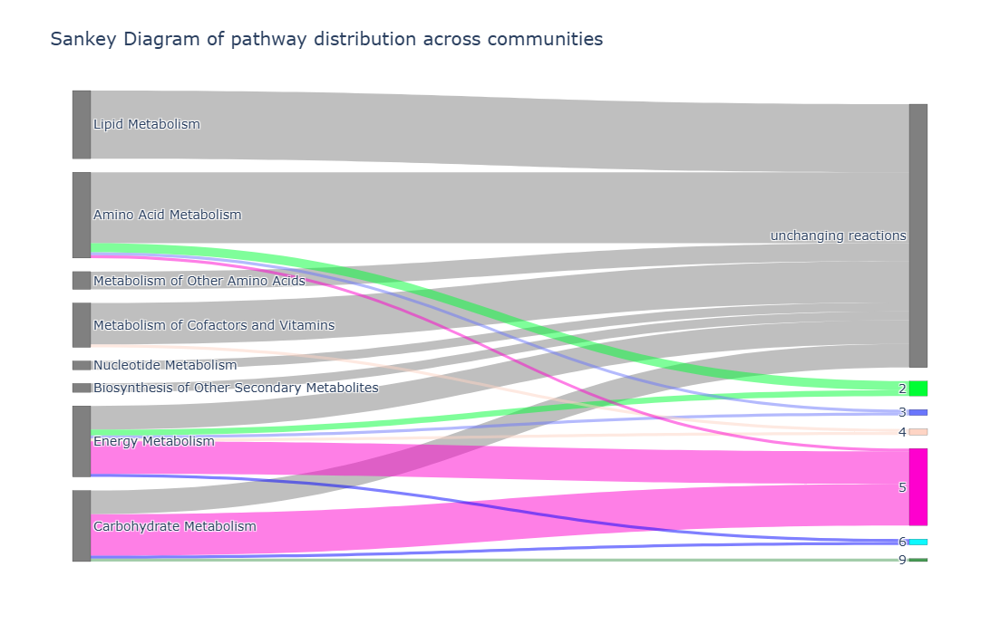

In [78]:
# sankey diagram of KEGG pathway categories
fig = cmp.community_sankey_diagram(comm_map, list(pathway_hierarchy.keys()), mouse_normalized_div_by_max, id_dict, diagram_height = 700, pw_hierarchy=pathway_hierarchy)
fig.show()

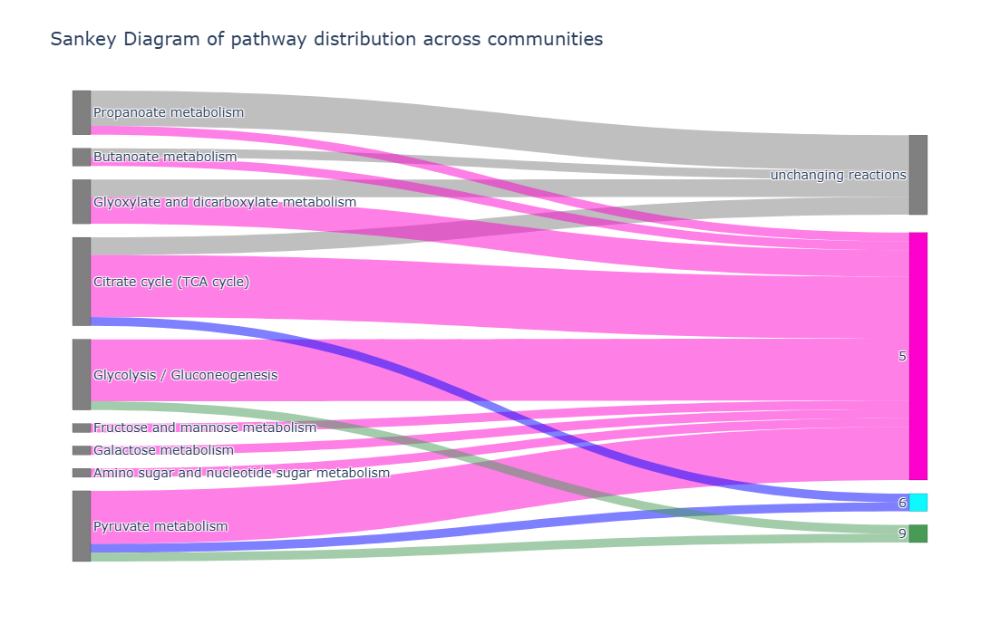

In [79]:
# sankey diagram of KEGG pathway category "carbohydrate metabolism"
fig = cmp.community_sankey_diagram(comm_map, pathway_hierarchy['Carbohydrate Metabolism'], mouse_normalized_div_by_max, id_dict, diagram_height = 700)
fig.show()

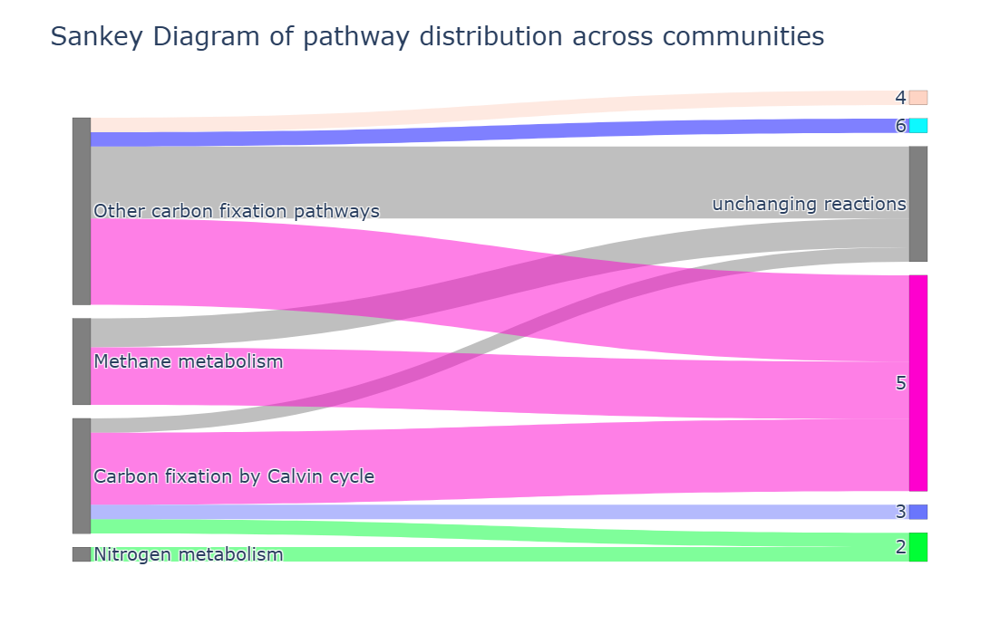

In [80]:
# sankey diagram of KEGG pathway category "energy metabolism"
fig = cmp.community_sankey_diagram(comm_map, pathway_hierarchy['Energy Metabolism'], mouse_normalized_div_by_max, id_dict, diagram_height = 700, text_size = 20)
fig.show()

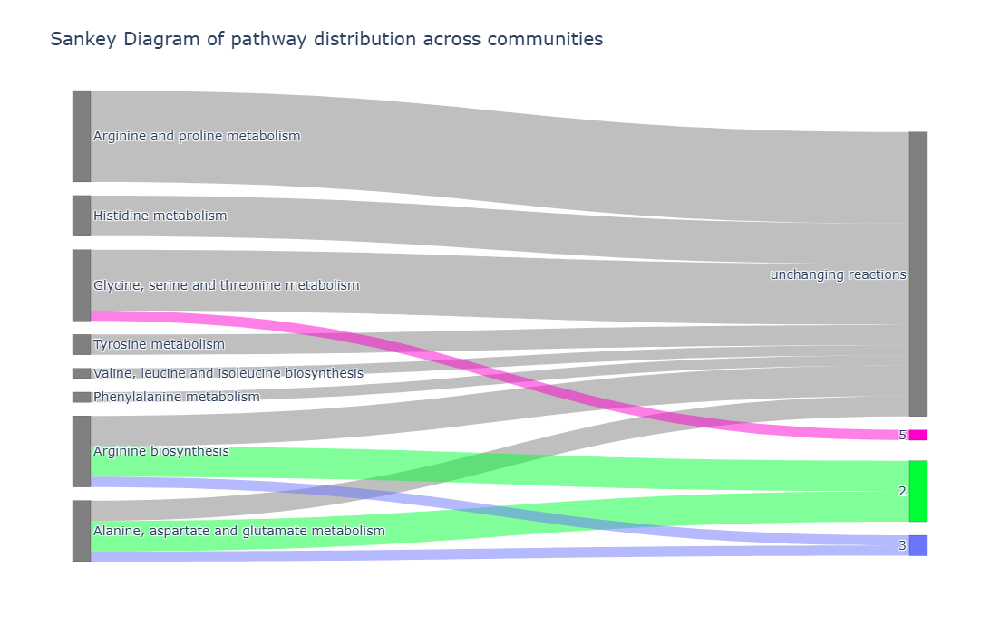

In [81]:
# sankey diagram of KEGG pathway category "Amino acid metabolism"
fig = cmp.community_sankey_diagram(comm_map, pathway_hierarchy['Amino Acid Metabolism'], mouse_normalized_div_by_max, id_dict, diagram_height = 700)
fig.show()